# CIFAR-100 generative model

## Imports

In [1]:
import math
import numpy as np
import torch
import torch.nn as nn
import torch.autograd as autograd
import torch.nn.functional as F
import torch.nn.utils as utils
import torchvision
import matplotlib.pyplot as plt
from IPython import display as disp

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

## Import Dataset

In [2]:
# helper function to make getting another batch of data easier
def cycle(iterable):
    while True:
        for x in iterable:
            yield x

class_names = ['apple','aquarium_fish','baby','bear','beaver','bed','bee','beetle','bicycle','bottle','bowl','boy','bridge','bus','butterfly','camel','can','castle','caterpillar','cattle','chair','chimpanzee','clock','cloud','cockroach','couch','crab','crocodile','cup','dinosaur','dolphin','elephant','flatfish','forest','fox','girl','hamster','house','kangaroo','computer_keyboard','lamp','lawn_mower','leopard','lion','lizard','lobster','man','maple_tree','motorcycle','mountain','mouse','mushroom','oak_tree','orange','orchid','otter','palm_tree','pear','pickup_truck','pine_tree','plain','plate','poppy','porcupine','possum','rabbit','raccoon','ray','road','rocket','rose','sea','seal','shark','shrew','skunk','skyscraper','snail','snake','spider','squirrel','streetcar','sunflower','sweet_pepper','table','tank','telephone','television','tiger','tractor','train','trout','tulip','turtle','wardrobe','whale','willow_tree','wolf','woman','worm',]

train_loader = torch.utils.data.DataLoader(
    torchvision.datasets.CIFAR100('data', train=True, download=True, transform=torchvision.transforms.Compose([
        torchvision.transforms.ToTensor()
    ])),
    batch_size=64, drop_last=True)

test_loader = torch.utils.data.DataLoader(
    torchvision.datasets.CIFAR100('data', train=False, download=True, transform=torchvision.transforms.Compose([
        torchvision.transforms.ToTensor()
    ])),
    batch_size=64, drop_last=True)

train_iterator = iter(cycle(train_loader))
test_iterator = iter(cycle(test_loader))

print(f'> Size of training dataset {len(train_loader.dataset)}')
print(f'> Size of test dataset {len(test_loader.dataset)}')

Files already downloaded and verified
Files already downloaded and verified
> Size of training dataset 50000
> Size of test dataset 10000


## View Test Data

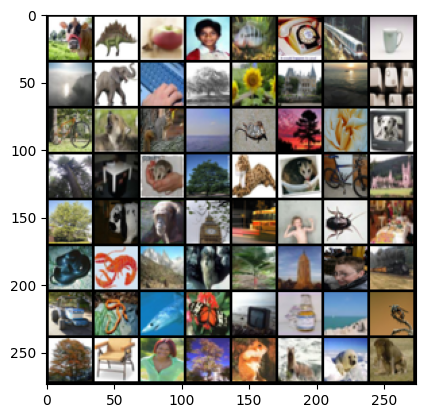

In [3]:
# let's view some of the training data
plt.rcParams['figure.dpi'] = 100
x,t = next(train_iterator)
x,t = x.to(device), t.to(device)
plt.imshow(torchvision.utils.make_grid(x).cpu().numpy().transpose(1, 2, 0), cmap=plt.cm.binary)
plt.show()

## Defining Model

In [4]:
# Based on the example code from:
# https://colab.research.google.com/github/atapour/dl-pytorch/blob/main/Simple_GAN_Example/Simple_GAN_Example.ipynb#scrollTo=ccMuktrKukIj
# Adapted to use Convolutional Layers, which was inspired by:

# https://github.com/atapour/dl-pytorch/blob/main/Simple_GAN_Example/Simple_GAN_Example.ipynb
# Optimized DCGAN Generator
class Generator(nn.Module):
    def __init__(self, z_dim, img_channels):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # First layer
            nn.ConvTranspose2d(z_dim, 184, kernel_size=4, stride=1, padding=0, bias=False), #184,4,4
            nn.BatchNorm2d(184),
            nn.ReLU(True),
            
            # Added layer (slightly reduced filters)
            nn.ConvTranspose2d(184, 128, kernel_size=4, stride=2, padding=1, bias=False),  #128,8,8
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            # Adjusted filters in subsequent layers
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),  #64,16,16
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(64, img_channels, kernel_size=4, stride=2, padding=1, bias=False),  #img_channels,32,32
            nn.Tanh()
        )

    def forward(self, z):
        return self.net(z)


# SN - GAN Discriminator from
# SPECTRAL NORMALIZATION FOR GENERATIVE ADVERSARIAL NETWORKS
# https://arxiv.org/abs/1802.05957
class Discriminator(nn.Module):
    def __init__(self, img_channels):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            
            utils.spectral_norm(nn.Conv2d(img_channels, 32, kernel_size=4, stride=2, padding=1, bias=False)),  #32,16,16
            nn.LeakyReLU(0.2, inplace=True),

            utils.spectral_norm(nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1, bias=False)),  #64,8,8
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            utils.spectral_norm(nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False)),  #128,4,4
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            utils.spectral_norm(nn.Conv2d(128, 1, kernel_size=4, stride=1, padding=0, bias=False)),  #1,1,1
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.net(img).view(-1, 1)


# Hyperparameters
params = {
    'z_dim': 100,
    'img_channels': 3,
    'batch_size': train_loader.batch_size,
}

# Instantiate models
G = Generator(params['z_dim'], params['img_channels']).to(device)
D = Discriminator(params['img_channels']).to(device)

# Count model parameters
num_params = sum(p.numel() for p in G.parameters()) + sum(p.numel() for p in D.parameters())
print(f'> Number of model parameters: {num_params}')
if num_params > 1000000:
    print("> Warning: you have gone over your parameter budget and will have a grade penalty!")

# Optimizers
optim_G = torch.optim.Adam(G.parameters(), lr=0.0005, betas=(0.5, 0.999))
optim_D = torch.optim.Adam(D.parameters(), lr=0.0005, betas=(0.5, 0.999))

> Number of model parameters: 973936


## Training Loop

Step 1000, D_loss: 1.204, G_loss: 1.368


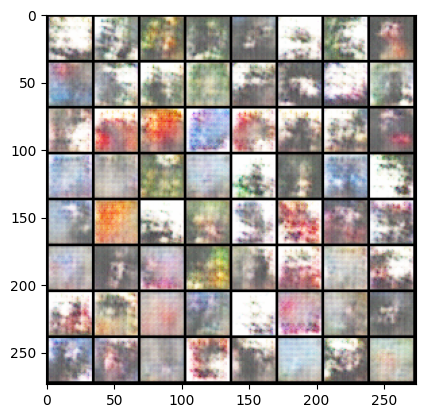

Step 2000, D_loss: 1.202, G_loss: 1.215


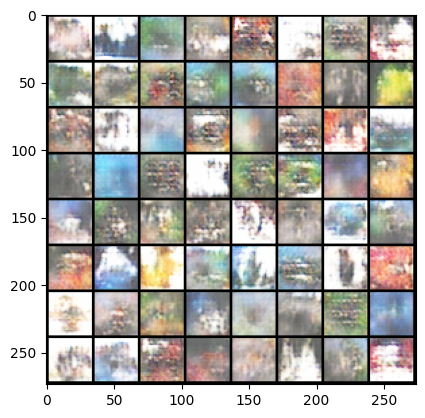

Step 3000, D_loss: 1.201, G_loss: 1.204


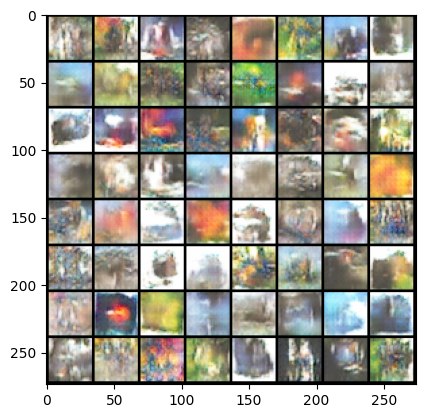

Step 4000, D_loss: 1.147, G_loss: 1.188


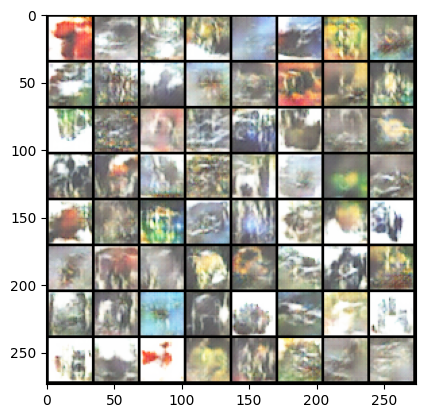

Step 5000, D_loss: 1.191, G_loss: 1.147


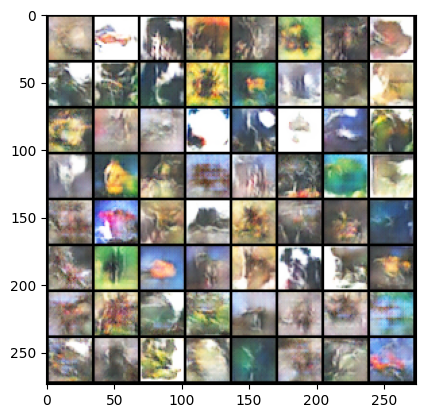

Step 6000, D_loss: 1.207, G_loss: 1.118


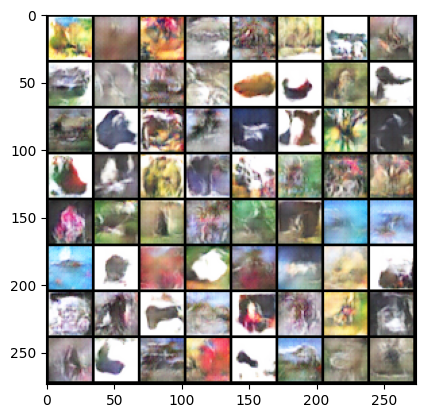

Step 7000, D_loss: 1.196, G_loss: 1.112


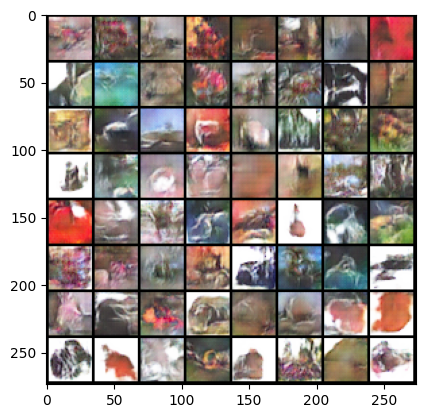

Step 8000, D_loss: 1.173, G_loss: 1.118


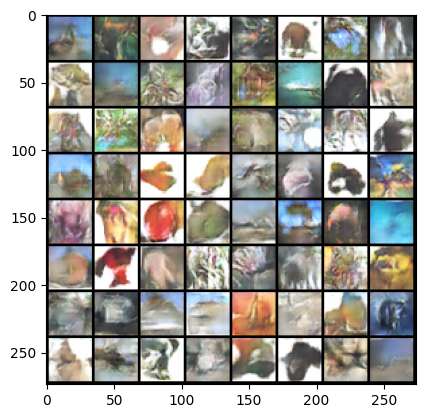

Step 9000, D_loss: 1.147, G_loss: 1.162


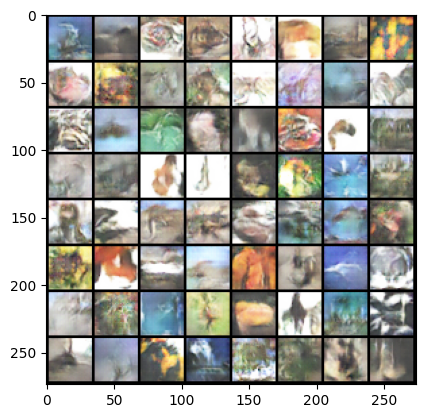

Step 10000, D_loss: 1.116, G_loss: 1.193


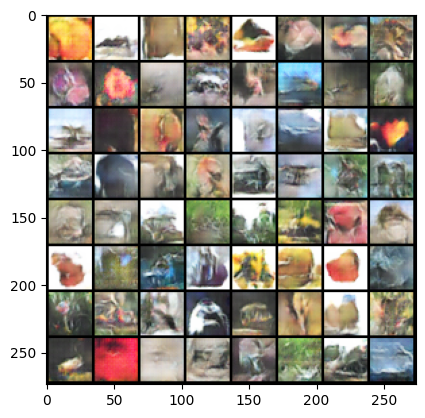

Step 11000, D_loss: 1.083, G_loss: 1.200


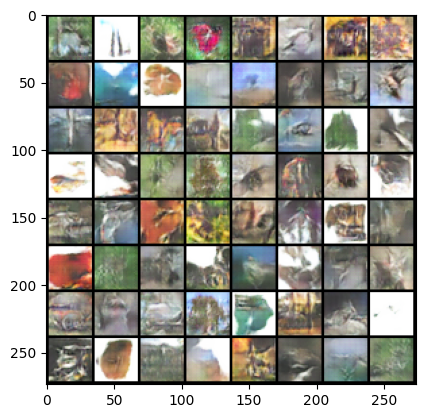

Step 12000, D_loss: 1.074, G_loss: 1.213


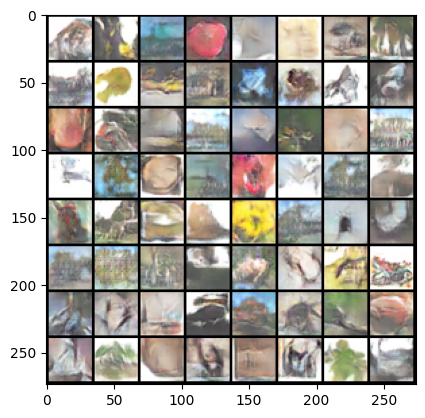

Step 13000, D_loss: 1.081, G_loss: 1.204


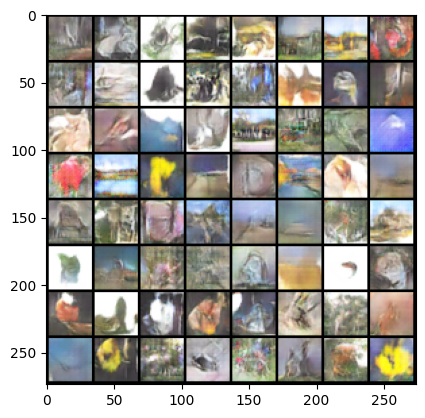

Step 14000, D_loss: 1.062, G_loss: 1.204


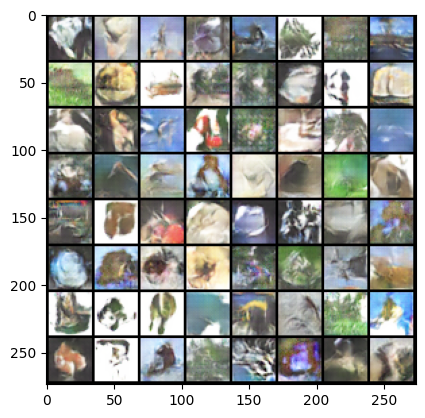

Step 15000, D_loss: 1.056, G_loss: 1.217


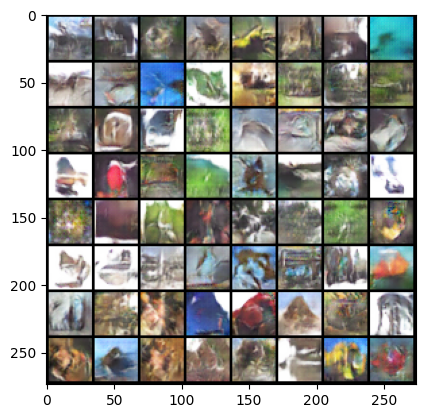

Step 16000, D_loss: 1.054, G_loss: 1.222


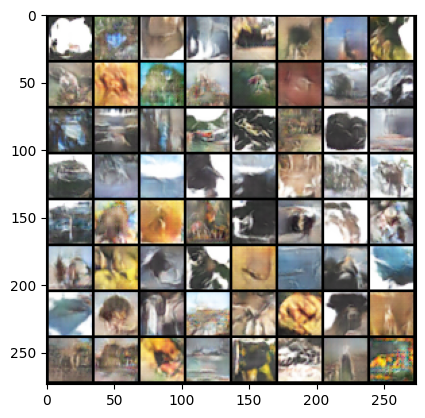

Step 17000, D_loss: 1.050, G_loss: 1.218


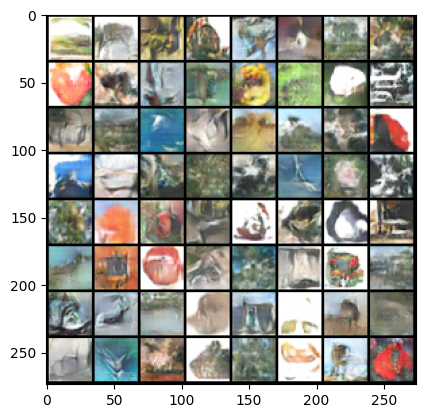

Step 18000, D_loss: 1.062, G_loss: 1.251


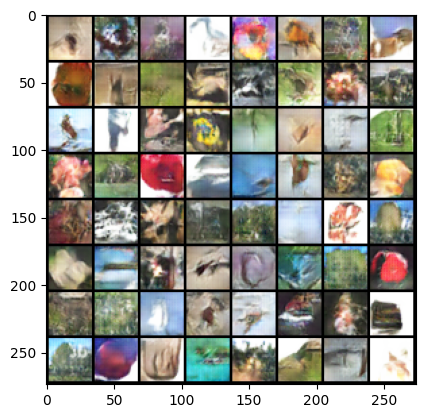

Step 19000, D_loss: 1.012, G_loss: 1.246


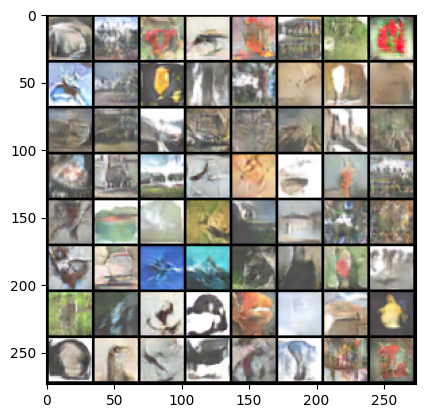

Step 20000, D_loss: 1.024, G_loss: 1.261


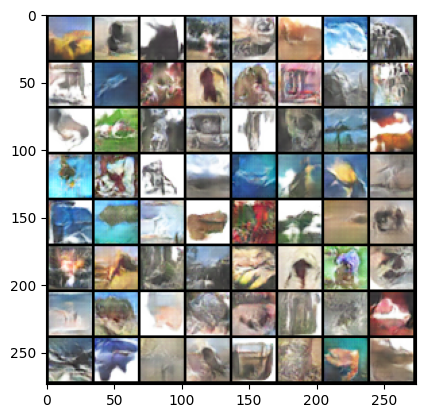

Step 21000, D_loss: 1.004, G_loss: 1.262


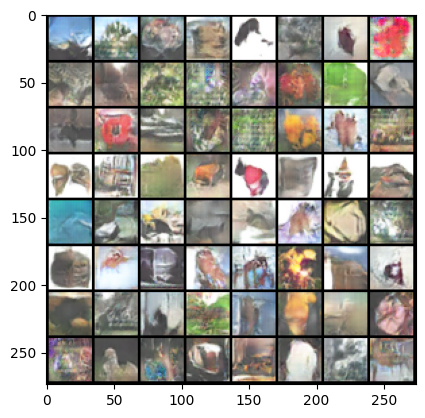

Step 22000, D_loss: 0.978, G_loss: 1.291


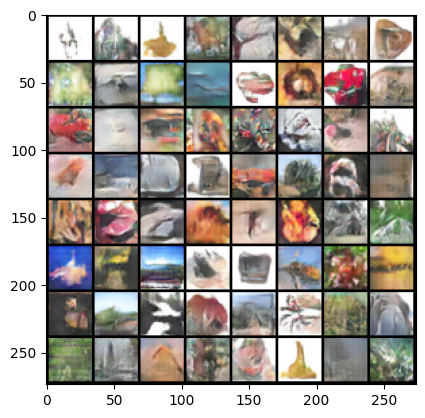

Step 23000, D_loss: 0.975, G_loss: 1.284


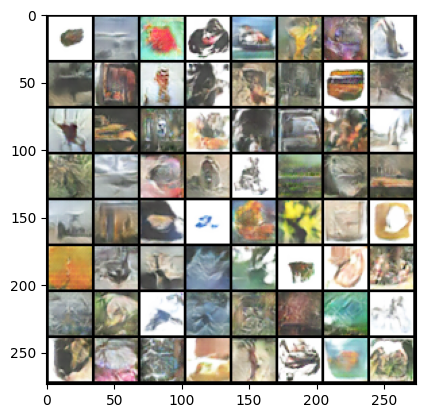

Step 24000, D_loss: 0.975, G_loss: 1.297


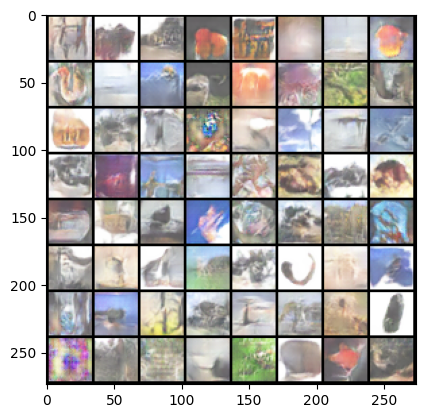

Step 25000, D_loss: 0.873, G_loss: 1.319


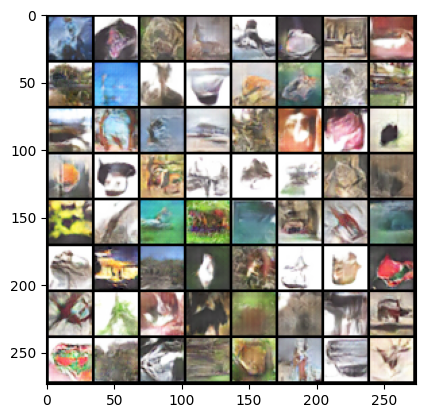

Step 26000, D_loss: 0.952, G_loss: 1.308


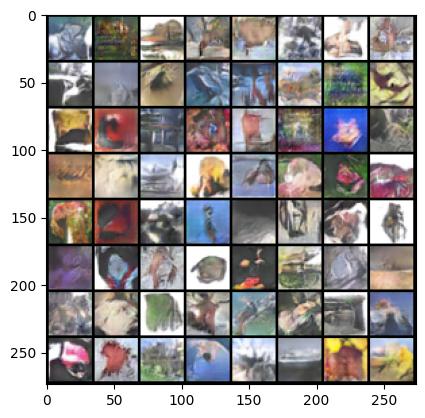

Step 27000, D_loss: 0.971, G_loss: 1.310


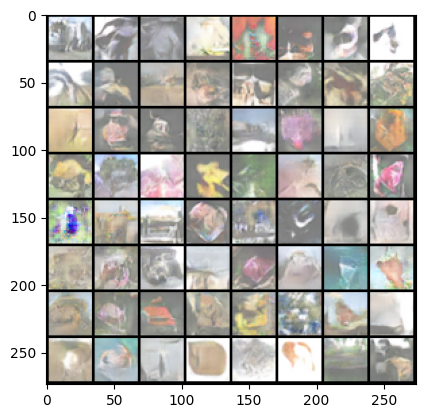

Step 28000, D_loss: 0.958, G_loss: 1.318


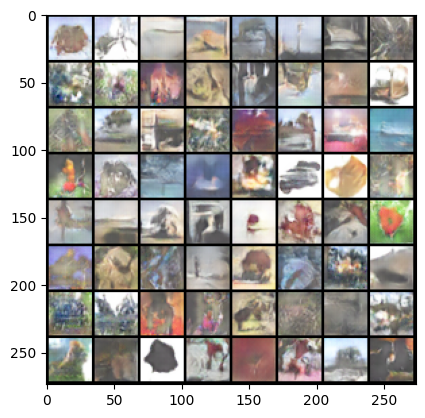

Step 29000, D_loss: 0.940, G_loss: 1.337


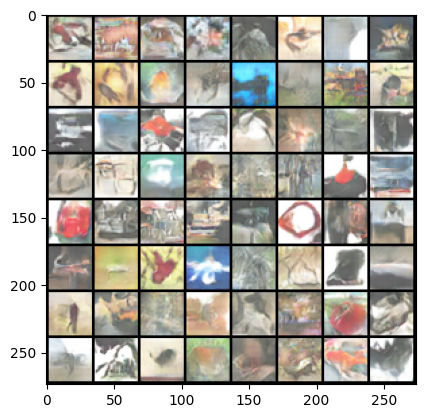

Step 30000, D_loss: 0.954, G_loss: 1.325


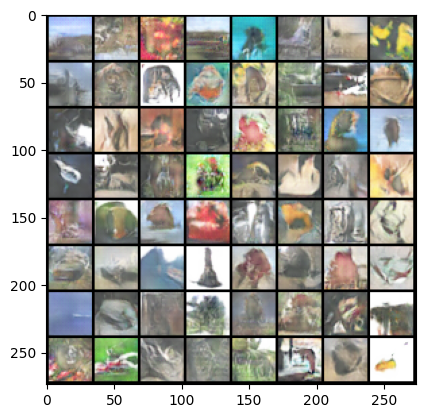

Step 31000, D_loss: 0.929, G_loss: 1.349


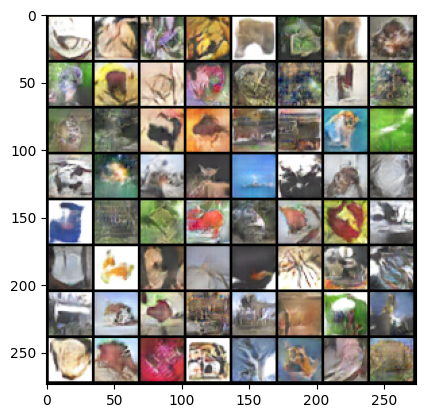

Step 32000, D_loss: 0.920, G_loss: 1.356


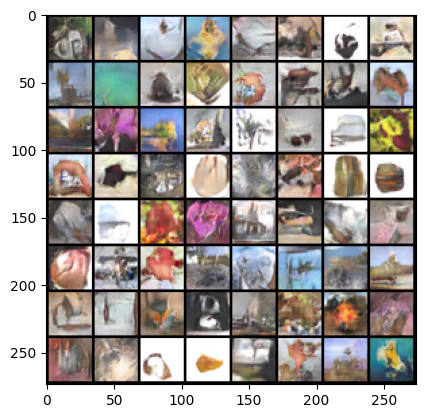

Step 33000, D_loss: 0.911, G_loss: 1.362


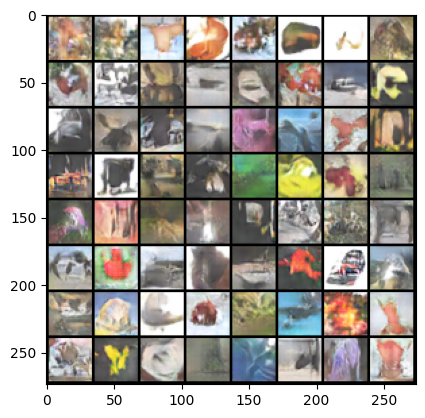

Step 34000, D_loss: 0.932, G_loss: 1.359


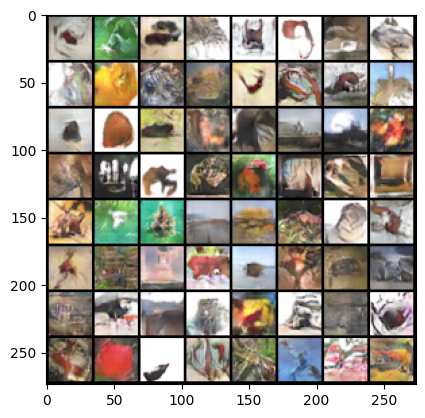

Step 35000, D_loss: 0.918, G_loss: 1.371


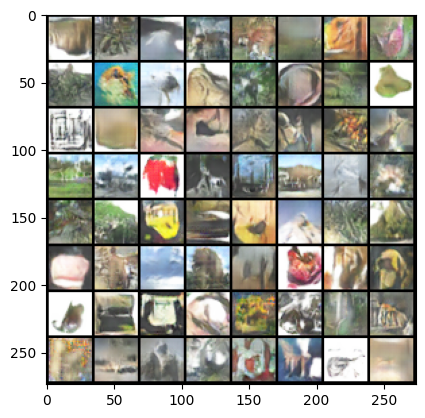

Step 36000, D_loss: 0.920, G_loss: 1.376


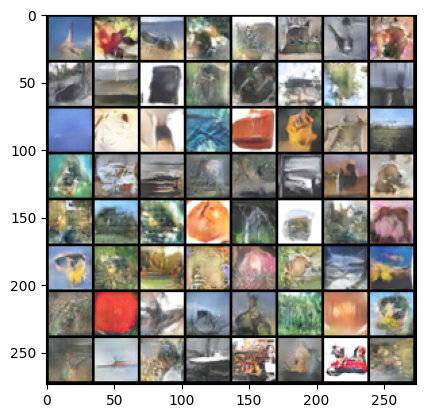

Step 37000, D_loss: 0.896, G_loss: 1.400


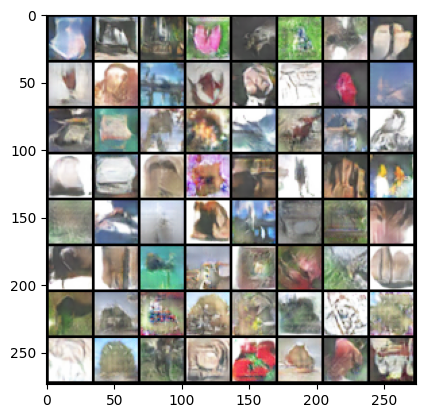

Step 38000, D_loss: 0.883, G_loss: 1.403


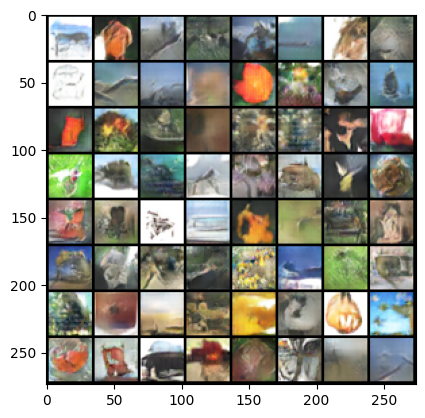

Step 39000, D_loss: 0.880, G_loss: 1.409


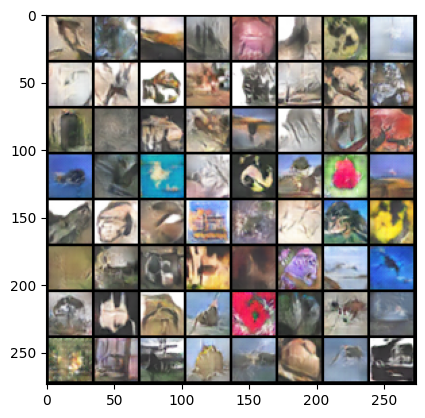

Step 40000, D_loss: 0.874, G_loss: 1.418


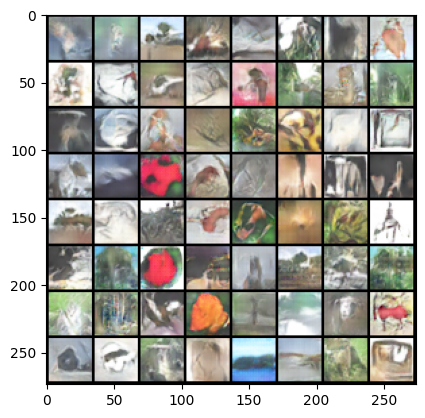

Step 41000, D_loss: 0.876, G_loss: 1.417


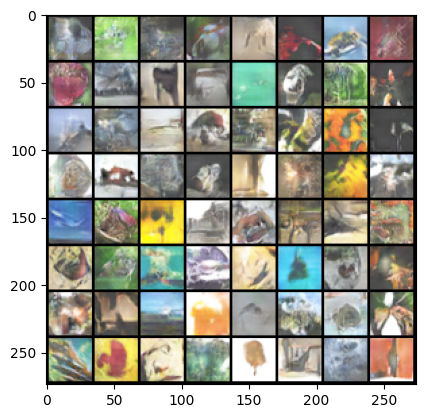

Step 42000, D_loss: 0.866, G_loss: 1.432


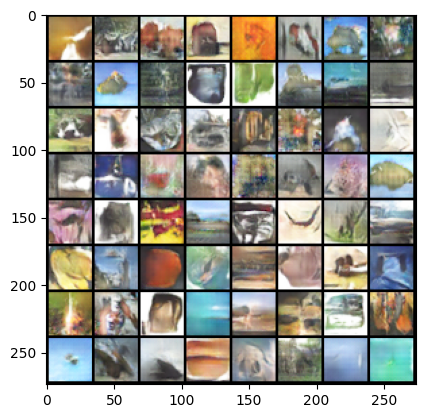

Step 43000, D_loss: 0.847, G_loss: 1.442


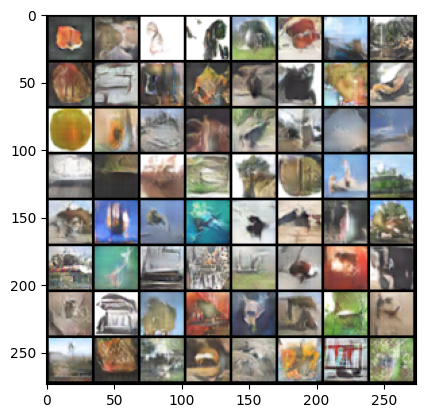

Step 44000, D_loss: 0.855, G_loss: 1.463


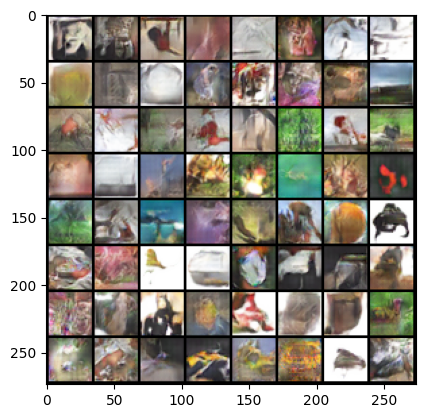

Step 45000, D_loss: 0.861, G_loss: 1.457


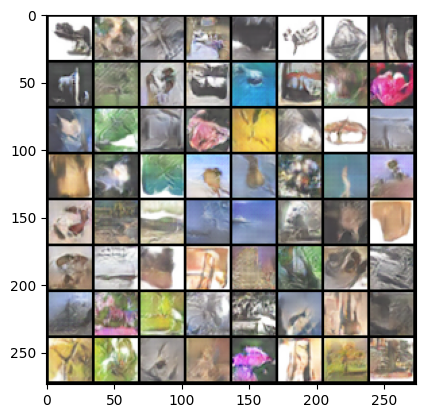

Step 46000, D_loss: 0.849, G_loss: 1.455


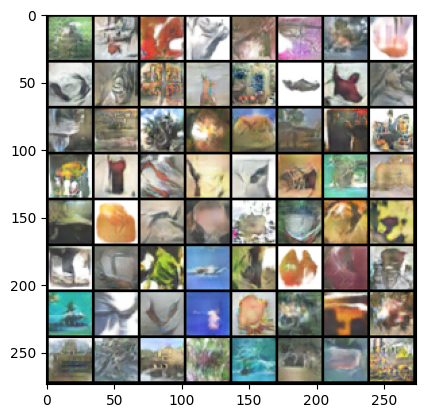

Step 47000, D_loss: 0.858, G_loss: 1.469


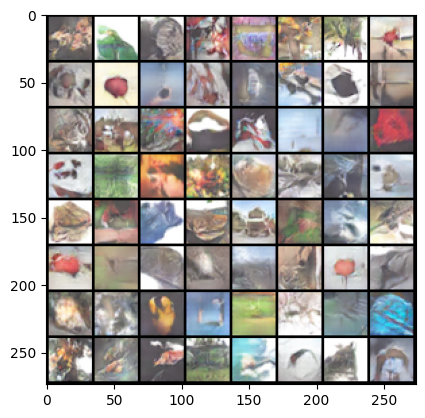

Step 48000, D_loss: 0.841, G_loss: 1.489


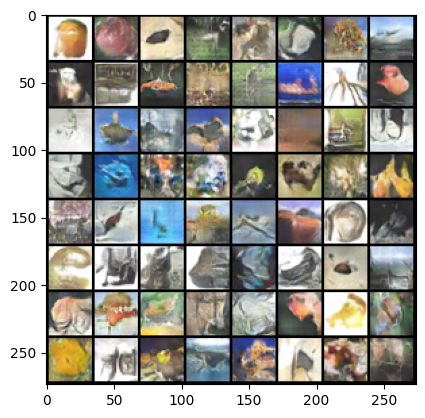

Step 49000, D_loss: 0.837, G_loss: 1.490


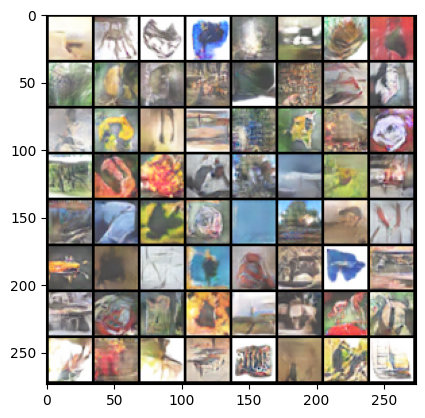

Step 50000, D_loss: 0.787, G_loss: 1.531


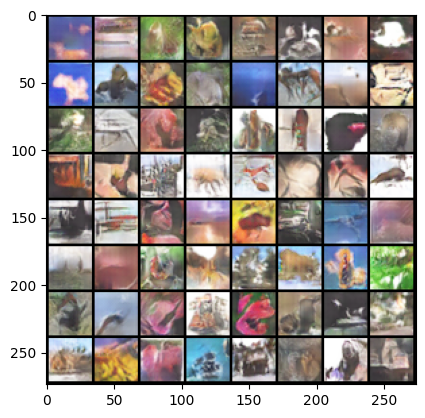

In [6]:
# Training loop
steps = 0
criterion = nn.BCELoss()

while steps < 50000:
    loss_arr_D = np.zeros(0)
    loss_arr_G = np.zeros(0)

    for i, (x, _) in enumerate(train_loader):
        x = x.to(device)
        batch_size = x.size(0)

        # Train Discriminator
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)
        z = torch.randn(batch_size, params['z_dim'], 1, 1).to(device)
        fake_imgs = G(z)

        real_loss = criterion(D(x), real_labels)
        fake_loss = criterion(D(fake_imgs.detach()), fake_labels)
        D_loss = real_loss + fake_loss

        optim_D.zero_grad()
        D_loss.backward()
        optim_D.step()

        # Train Generator
        G_loss = criterion(D(fake_imgs), real_labels)

        optim_G.zero_grad()
        G_loss.backward()
        optim_G.step()

        loss_arr_D = np.append(loss_arr_D, D_loss.item())
        loss_arr_G = np.append(loss_arr_G, G_loss.item())

        steps += 1
        if steps % 1000 == 0:
            print(f"Step {steps}, D_loss: {loss_arr_D.mean():.3f}, G_loss: {loss_arr_G.mean():.3f}")

            # Sample and visualize
            G.eval()
            with torch.no_grad():
                z = torch.randn(params['batch_size'], params['z_dim'], 1, 1).to(device)
                samples = G(z).cpu().detach()
            plt.imshow(torchvision.utils.make_grid(samples, normalize=True).permute(1, 2, 0))
            plt.show()
            G.train()

        if steps >= 50000:
            break

## Save Weights
this code was only used to save and load weights for this model under the constraints

In [5]:
# Paths for saving weights
G_weights_path = "generator_weights.pth"
D_weights_path = "discriminator_weights.pth"

# Function to save weights
def save_weights(G, D, G_path, D_path):
    torch.save(G.state_dict(), G_path)
    torch.save(D.state_dict(), D_path)
    print(f"Saved Generator weights to {G_path}")
    print(f"Saved Discriminator weights to {D_path}")

# Function to load weights
def load_weights(G, D, G_path, D_path, device):
    G.load_state_dict(torch.load(G_path, map_location=device, weights_only=True))
    D.load_state_dict(torch.load(D_path, map_location=device, weights_only=True))
    print(f"Loaded Generator weights from {G_path}")
    print(f"Loaded Discriminator weights from {D_path}")

# Save weights
# save_weights(G, D, G_weights_path, D_weights_path)

# Reload weights
# load_weights(G, D, G_weights_path, D_weights_path, device)


Loaded Generator weights from generator_weights.pth
Loaded Discriminator weights from discriminator_weights.pth


## Latent Interpolation

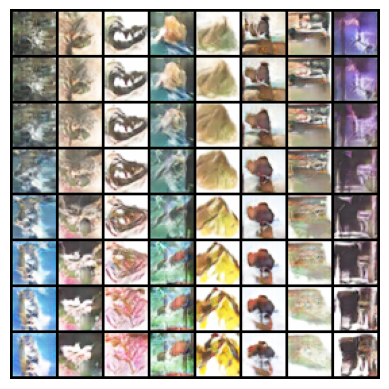

In [17]:
# Define an 8x8 grid size explicitly
grid_size = 8  # Rows and columns in the grid
num_samples = grid_size**2

# Generate two latent vectors
z_top = torch.randn(grid_size, params['z_dim'], 1, 1).to(device)
z_bottom = torch.randn(grid_size, params['z_dim'], 1, 1).to(device)

t = torch.linspace(0, 1, grid_size).view(-1, 1, 1, 1).to(device)
interpolated_images = []

# Perform interpolation row by row
for i in range(grid_size):
    z_row = (1 - t[i]) * z_top + t[i] * z_bottom
    images_row = G(z_row)
    interpolated_images.append(images_row)

# Concatenate all rows to form the grid
lerp_g = torch.cat(interpolated_images, dim=0)

# Visualize the 8x8 grid
plt.rcParams['figure.dpi'] = 100
plt.axis('off')
plt.imshow(
    torchvision.utils.make_grid(lerp_g, nrow=grid_size, normalize=True).cpu().permute(1, 2, 0).numpy()
)
plt.show()


## Calculate FID Scores

In [10]:
%%capture
!pip install clean-fid
import os
from cleanfid import fid
from torchvision.utils import save_image

In [153]:
# define directories
real_images_dir = 'real_images'
generated_images_dir = 'generated_images'
num_samples = 10000 # do not change

# create/clean the directories
def setup_directory(directory):
    if os.path.exists(directory):
        !rm -r {directory} # remove any existing (old) data
    os.makedirs(directory)

setup_directory(real_images_dir)
setup_directory(generated_images_dir)

# generate and save 10k model samples
num_generated = 0
while num_generated < num_samples:

    # sample from your model, you can modify this
    z = torch.randn(batch_size, params['z_dim'], 1, 1).to(device)
    samples_batch = G(z)

    for image in samples_batch:
        if num_generated >= num_samples:
            break
        save_image(image, os.path.join(generated_images_dir, f"gen_img_{num_generated}.png"))
        num_generated += 1

# save 10k images from the CIFAR-100 test dataset
num_saved_real = 0
while num_saved_real < num_samples:
    real_samples_batch, _ = next(test_iterator)
    for image in real_samples_batch:
        if num_saved_real >= num_samples:
            break
        save_image(image, os.path.join(real_images_dir, f"real_img_{num_saved_real}.png"))
        num_saved_real += 1

In [154]:
# compute FID
score = fid.compute_fid(real_images_dir, generated_images_dir, mode="clean")
print(f"FID score: {score}")

compute FID between two folders
Found 10000 images in the folder real_images


FID real_images : 100%|██████████| 313/313 [01:04<00:00,  4.83it/s]


Found 10000 images in the folder generated_images


FID generated_images : 100%|██████████| 313/313 [00:54<00:00,  5.78it/s]


FID score: 56.63560410703974


In [ ]:
#
plt.imshow()